# EDA

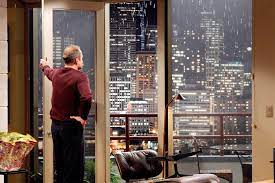

William Rodriguez 	
Buyer 	
2 people  
country (best timing & non-renovated) & city house (fast & central location)  
wants two houses

In [263]:
import warnings

warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import altair as alt
import json


from matplotlib.ticker import PercentFormatter
plt.rcParams.update({ "figure.figsize" : (8, 5),"axes.facecolor" : "white", "axes.edgecolor":  "black"})
plt.rcParams["figure.facecolor"]= "w"
pd.plotting.register_matplotlib_converters()
pd.set_option('display.float_format', lambda x: '%.3f' % x)

import the data set

In [264]:
df_full = pd.read_csv("data/all_houses.csv")
df_full.head(10)

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,house_id,id.1
0,7129300520,3.000,1.000,1180.000,5650.000,1.000,NaN,0.000,3,7,...,0.000,98178,47.511,-122.257,1340.000,5650.000,2014-10-13,221900.000,7129300520,1
1,6414100192,3.000,2.250,2570.000,7242.000,2.000,0.000,0.000,3,7,...,19910.000,98125,47.721,-122.319,1690.000,7639.000,2014-12-09,538000.000,6414100192,2
2,5631500400,2.000,1.000,770.000,10000.000,1.000,0.000,0.000,3,6,...,NaN,98028,47.738,-122.233,2720.000,8062.000,2015-02-25,180000.000,5631500400,3
3,2487200875,4.000,3.000,1960.000,5000.000,1.000,0.000,0.000,5,7,...,0.000,98136,47.521,-122.393,1360.000,5000.000,2014-12-09,604000.000,2487200875,4
4,1954400510,3.000,2.000,1680.000,8080.000,1.000,0.000,0.000,3,8,...,0.000,98074,47.617,-122.045,1800.000,7503.000,2015-02-18,510000.000,1954400510,5
5,7237550310,4.000,4.500,5420.000,101930.000,1.000,0.000,0.000,3,11,...,0.000,98053,47.656,-122.005,4760.000,101930.000,2014-05-12,1230000.000,7237550310,6
6,1321400060,3.000,2.250,1715.000,6819.000,2.000,0.000,0.000,3,7,...,0.000,98003,47.310,-122.327,2238.000,6819.000,2014-06-27,257500.000,1321400060,7
7,2008000270,3.000,1.500,1060.000,9711.000,1.000,0.000,NaN,3,7,...,0.000,98198,47.410,-122.315,1650.000,9711.000,2015-01-15,291850.000,2008000270,8
8,2414600126,3.000,1.000,1780.000,7470.000,1.000,0.000,0.000,3,7,...,0.000,98146,47.512,-122.337,1780.000,8113.000,2015-04-15,229500.000,2414600126,9
9,3793500160,3.000,2.500,1890.000,6560.000,2.000,0.000,0.000,3,7,...,0.000,98038,47.368,-122.031,2390.000,7570.000,2015-03-12,323000.000,3793500160,10


clean the data

In [265]:
df_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   bedrooms       21597 non-null  float64
 2   bathrooms      21597 non-null  float64
 3   sqft_living    21597 non-null  float64
 4   sqft_lot       21597 non-null  float64
 5   floors         21597 non-null  float64
 6   waterfront     19206 non-null  float64
 7   view           21534 non-null  float64
 8   condition      21597 non-null  int64  
 9   grade          21597 non-null  int64  
 10  sqft_above     21597 non-null  float64
 11  sqft_basement  21145 non-null  float64
 12  yr_built       21597 non-null  int64  
 13  yr_renovated   17749 non-null  float64
 14  zipcode        21597 non-null  int64  
 15  lat            21597 non-null  float64
 16  long           21597 non-null  float64
 17  sqft_living15  21597 non-null  float64
 18  sqft_l

In [442]:
df_full.columns

Index(['id', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'date', 'price', 'house_id', 'year',
       'month'],
      dtype='object')

In [ ]:
numerical_columns = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'condition', 'grade', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long', 'sqft_living15', 'sqft_lot15', 'price']

In [266]:
df_full.duplicated().value_counts()

False    21597
dtype: int64

In [267]:
df_full["date"] = pd.to_datetime(df_full["date"], format="%Y/%m/%d")

In [268]:
df_full.isna().sum()

id                  0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2391
view               63
condition           0
grade               0
sqft_above          0
sqft_basement     452
yr_built            0
yr_renovated     3848
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
date                0
price               0
house_id            0
id.1                0
dtype: int64

In [269]:
df_full.nunique()

id               21420
bedrooms            12
bathrooms           29
sqft_living       1034
sqft_lot          9776
floors               6
waterfront           2
view                 5
condition            5
grade               11
sqft_above         942
sqft_basement      303
yr_built           116
yr_renovated        70
zipcode             70
lat               5033
long               752
sqft_living15      777
sqft_lot15        8682
date               372
price             3622
house_id         21420
id.1             21597
dtype: int64

In [270]:
df_full.drop(columns=["house_id"], inplace=True)

In [271]:
df_full.rename({"id.1":"house_id"}, inplace=True, axis=1)
df_full.nunique()

id               21420
bedrooms            12
bathrooms           29
sqft_living       1034
sqft_lot          9776
floors               6
waterfront           2
view                 5
condition            5
grade               11
sqft_above         942
sqft_basement      303
yr_built           116
yr_renovated        70
zipcode             70
lat               5033
long               752
sqft_living15      777
sqft_lot15        8682
date               372
price             3622
house_id         21597
dtype: int64

In [272]:
# Load GeoJSON data from a file
with open('data/king_county_washington.geojson') as f:
    geojson_data = json.load(f)

# Convert GeoJSON data to a Pandas DataFrame (Optional)
# df = pd.json_normalize(geojson_data['features'])
# df.dropna(axis=1, how='all', inplace=True)

# Create an Altair chart for GeoJSON visualization
shape = alt.Chart(alt.Data(values=geojson_data)).mark_geoshape(
    stroke='black',
    strokeWidth=2,
    fill="grey",
    opacity=0.5
).properties(
    width=600,
    height=300
).project("albersUsa")

shape

alt.Chart(...)

In [273]:
df_samp = df_full.sample(5000)

# Create a scatter plot using Altair
zipchart = alt.Chart(df_samp).mark_circle(size=6,opacity=1).encode(
    longitude='long:Q',  # Specify the longitude column and data type
    latitude='lat:Q',    # Specify the latitude column and data type
    color='zipcode:N',
    tooltip=[]
).project('albersUsa').properties(
    width=600,
    height=300
)

shape + zipchart

alt.LayerChart(...)

In [274]:
df_samp = df_full.sample(5000)

# Create a scatter plot using Altair
chart = alt.Chart(df_samp).mark_circle(size=6,opacity=1, color="white").encode(
    longitude='long:Q',  # Specify the longitude column and data type
    latitude='lat:Q',    # Specify the latitude column and data type
    # color='zipcode:N',
    tooltip=[]
).project('albersUsa').properties(
    width=600,
    height=300
)

shape + chart

alt.LayerChart(...)

In [275]:
# Define a custom function to format large numbers
def format_large_number(x, pos):
    """Format tick labels using 'M' for millions and 'B' for billions"""
    if x >= 1e9:
        return f'{x / 1e9:.0f}B'
    elif x >= 1e6:
        return f'{x / 1e6:.0f}M'
    elif x >= 1e3:
        return f'{x / 1e3:.0f}k'
    else:
        return f'{x:.0f}'

highly populated: Seattle!, Bellevue, Kent, Renton

Most central parts of seattle:

    Downtown Seattle (including Belltown): ZIP codes 98101, 98104
    Capitol Hill: ZIP codes 98102, 98112
    South Lake Union: ZIP code 98109
    First Hill: ZIP code 98104
    Belltown: ZIP code 98121

In [276]:
central_seattle_zips = [98101, 98104, 98102, 98112, 98109, 98104, 98121]

df_central = df_full.query("zipcode in @central_seattle_zips and 1 < bedrooms < 4 and bathrooms == 1")
df_central["zipcode"].unique()

array([98112, 98109, 98102], dtype=int64)

hoses found in Capitol Hill (98102, 98112) and South Lake Union (98109)

In [277]:
df_samp = df_full.sample(5000)

msize = 30
zip_colors = ['#66c2a5', '#8da0cb', '#fc8d62']

zip1 = alt.Chart(df_central.query("zipcode == 98102")).mark_circle(color=zip_colors[0],size=msize).encode(
    longitude='long:Q',  # Specify the longitude column and data type
    latitude='lat:Q',    # Specify the latitude column and data type
    tooltip=[]
).project('albersUsa').properties(
    width=600,
    height=300
)

zip2 = alt.Chart(df_central.query("zipcode == 98112")).mark_circle(color=zip_colors[1],size=msize).encode(
    longitude='long:Q',  # Specify the longitude column and data type
    latitude='lat:Q',    # Specify the latitude column and data type
    tooltip=[]
).project('albersUsa').properties(
    width=600,
    height=300
)

#8da0cb

zip3 = alt.Chart(df_central.query("zipcode == 98109")).mark_circle(color=zip_colors[2],size=msize).encode(
    longitude='long:Q',  # Specify the longitude column and data type
    latitude='lat:Q',    # Specify the latitude column and data type
    tooltip=[]
).project('albersUsa').properties(
    width=600,
    height=300
)

shape+chart+zip1+zip2+zip3

alt.LayerChart(...)

In [278]:
df_central.groupby("zipcode").count()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,date,price,house_id
zipcode,,,,,,,,,,,,,,,,,,,,,
98102,13,13,13,13,13,13,10,13,13,13,...,13,13,11,13,13,13,13,13,13,13
98109,17,17,17,17,17,17,15,17,17,17,...,17,17,16,17,17,17,17,17,17,17
98112,30,30,30,30,30,30,29,30,30,30,...,27,30,26,30,30,30,30,30,30,30


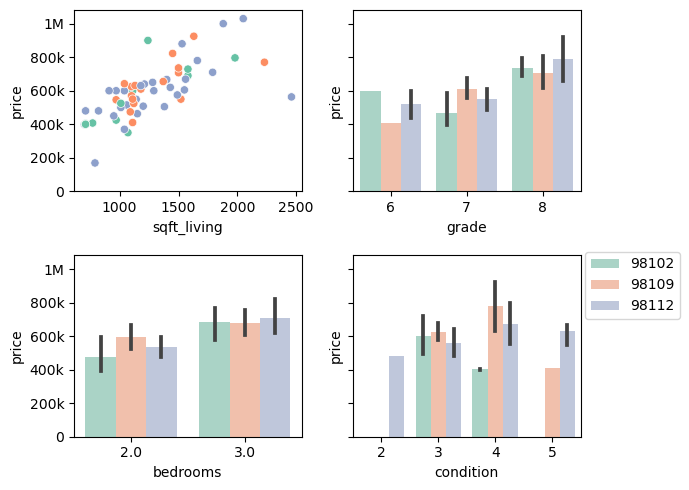

In [279]:
fig, axs = plt.subplots(2,2, figsize=(7,5), sharey=True)
legs = [False, False, False, 'auto']

sns.scatterplot(data=df_central, x='sqft_living', y="price", hue="zipcode", palette="Set2", ax=axs.flat[0], legend=False)

for i, feature in enumerate(['grade', 'bedrooms', 'condition']):
    sns.barplot(data=df_central, x=feature, y="price", hue="zipcode", ax=axs.flat[i+1], palette="Set2", alpha=0.6)
    if i==2:
        axs.flat[i+1].legend(loc=(1.02,0.65))
    else:
        axs.flat[i+1].legend_.remove()

for ax in axs.flat:
    # Apply the custom formatter to the y-axis
    ax = plt.gca()
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(format_large_number))

fig.tight_layout()

In [280]:
df_full["condition"].unique()

array([3, 5, 4, 1, 2], dtype=int64)

In [281]:
df_central.groupby("zipcode")["price"].mean()

zipcode
98102   540642.308
98109   632294.118
98112   593601.400
Name: price, dtype: float64

<AxesSubplot:xlabel='price', ylabel='Density'>

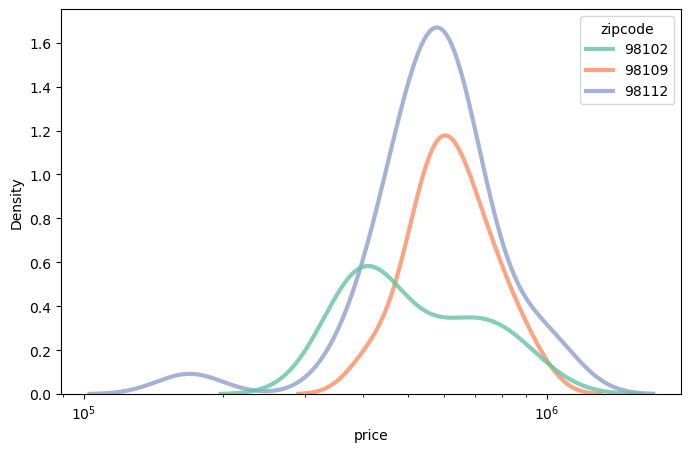

In [282]:
fig, ax = plt.subplots(1,1)
sns.kdeplot(data=df_central, x="price", hue="zipcode", palette="Set2", ax=ax, log_scale=True, lw=3, alpha=0.8)
# ax.set_yscale("log")
# ax.set_ylim(1e-10,1e-6)

<AxesSubplot:xlabel='price', ylabel='Density'>

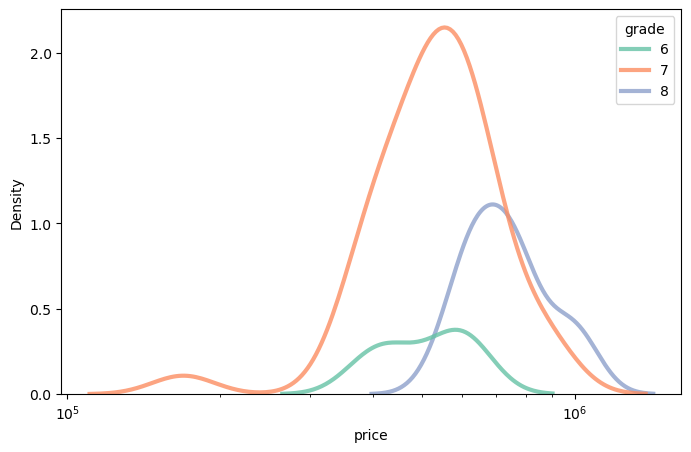

In [283]:
fig, ax = plt.subplots(1,1)
sns.kdeplot(data=df_central, x="price", hue="grade", palette="Set2", ax=ax, log_scale=True, lw=3, alpha=0.8)
# ax.set_yscale("log")
# ax.set_ylim(1e-10,1e-6)

In [284]:
df_central.sort_values("date")["date"]

3749    2014-05-05
9742    2014-05-07
10902   2014-05-09
7541    2014-05-15
3198    2014-05-20
11877   2014-05-29
6911    2014-06-05
16485   2014-06-09
21567   2014-06-10
20077   2014-06-11
10043   2014-06-12
12360   2014-06-16
14654   2014-06-17
1699    2014-06-20
18739   2014-06-24
14361   2014-07-01
18997   2014-07-02
13421   2014-07-28
9913    2014-07-31
17432   2014-08-08
18392   2014-08-12
7536    2014-08-22
15755   2014-08-30
4400    2014-09-15
961     2014-09-16
9360    2014-09-22
17807   2014-09-23
9972    2014-10-01
18740   2014-10-16
568     2014-10-22
17508   2014-10-27
1626    2014-10-29
6832    2014-11-03
3457    2014-11-10
5041    2014-11-10
18069   2014-11-19
7189    2014-11-19
11847   2014-11-21
5865    2014-11-25
27      2014-12-01
19570   2014-12-02
260     2014-12-02
18373   2014-12-03
16525   2014-12-15
9100    2014-12-18
10620   2015-01-23
18228   2015-01-23
13169   2015-01-23
1064    2015-01-23
15131   2015-01-27
8258    2015-01-28
1073    2015-02-05
1624    2015

Nice country side areas:  

    Snoqualmie (includes rural and scenic areas): ZIP codes 98065, 98068
    Fall City: ZIP code 98024
    Carnation: ZIP code 98014
    Duvall: ZIP code 98019
    Enumclaw (surrounding rural areas): ZIP codes 98022, 98092
    Vashon Island: ZIP code 98070
    Ravensdale: ZIP code 98051

I interpret non renovated as not recently renovated. Let's say not after 1982 (within last 40 years).

In [285]:
country_zips = [98065, 98068, 98024, 98014, 98019, 98022, 98092, 98070, 98051]

df_country = df_full.query("zipcode in @country_zips and yr_renovated < 19830 and 1 < bedrooms < 5 and bathrooms == 1")
sales_country_zips = df_country.sort_values("zipcode")["zipcode"].unique()
sales_country_zips

array([98014, 98019, 98022, 98024, 98065, 98070, 98092], dtype=int64)

sales found in Duvall (98019), Enumclaw (98092, 98022), Vashon Island (98070), Snoqualmie (98065), Fall City (98024), Carnation (98014)

In [286]:
color_set = ["#66c2a5", "#fc8d62", "#8da0cb", "#e78ac3", "#a6d854", "#ffd92f", "#e5c494", "#b3b3b3"]

In [287]:
df_samp = df_full.sample(5000)

zips=[]
for i, zc in enumerate(sales_country_zips):
    current_zip = alt.Chart(df_country.query("zipcode == @zc")).mark_circle(color=color_set[i],size=msize).encode(
                    longitude='long:Q',  # Specify the longitude column and data type
                    latitude='lat:Q',    # Specify the latitude column and data type
                    #color='price:Q',
                    tooltip=[]
                ).project('albersUsa').properties(
                    width=600,
                    height=300
                )
    zips.append(current_zip)
    
shape + chart + zips[0] + zips[1] + zips[2] + zips[3] + zips[4] + zips[5] + zips[6]

alt.LayerChart(...)

<AxesSubplot:xlabel='price', ylabel='Density'>

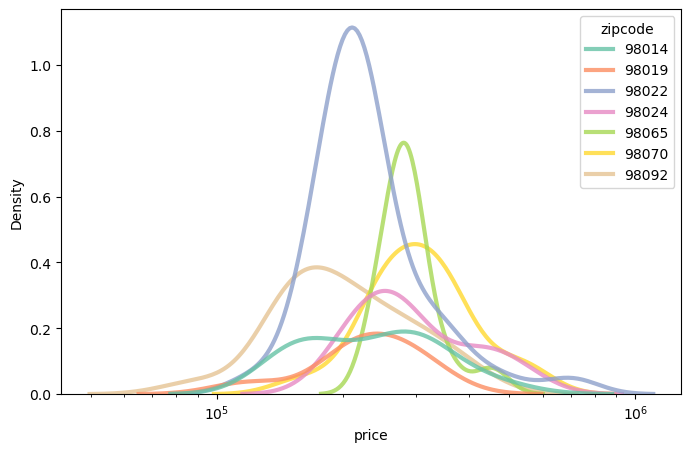

In [288]:
fig, ax = plt.subplots(1,1)
sns.kdeplot(data=df_country, x="price", hue="zipcode", palette="Set2", ax=ax, log_scale=True, lw=3, alpha=0.8)
# ax.set_yscale("log")
# ax.set_ylim(1e-10,1e-6)

<AxesSubplot:xlabel='price', ylabel='Density'>

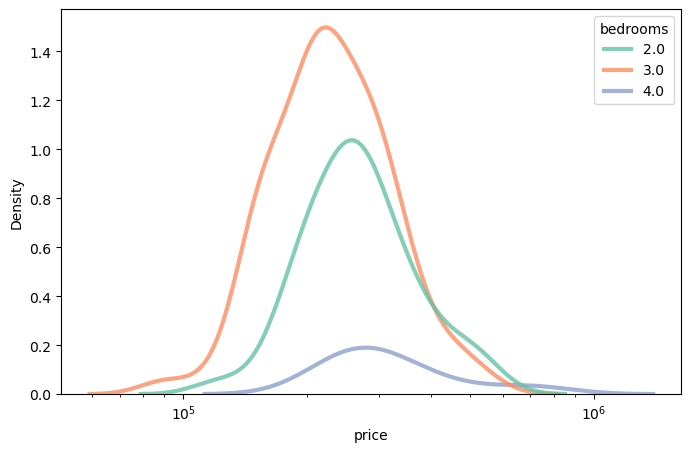

In [289]:
fig, ax = plt.subplots(1,1)
sns.kdeplot(data=df_country, x="price", hue="bedrooms", palette="Set2", ax=ax, log_scale=True, lw=3, alpha=0.8)
# ax.set_yscale("log")
# ax.set_ylim(1e-10,1e-6)

<AxesSubplot:xlabel='price', ylabel='Density'>

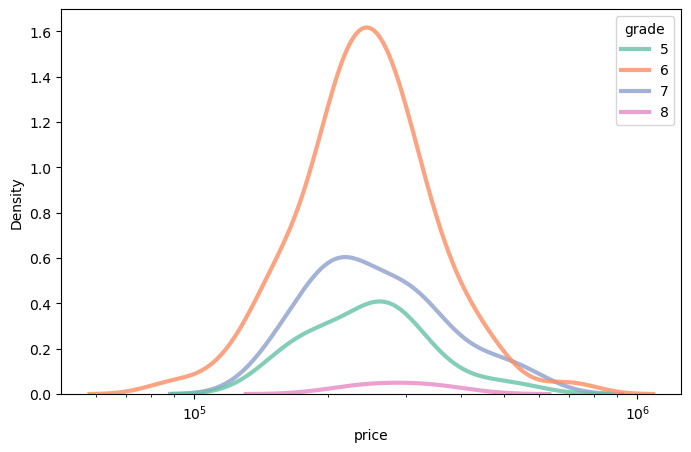

In [290]:
fig, ax = plt.subplots(1,1)
sns.kdeplot(data=df_country, x="price", hue="grade", palette="Set2", ax=ax, log_scale=True, lw=3, alpha=0.8)
# ax.set_yscale("log")
# ax.set_ylim(1e-10,1e-6)

<AxesSubplot:xlabel='date', ylabel='price'>

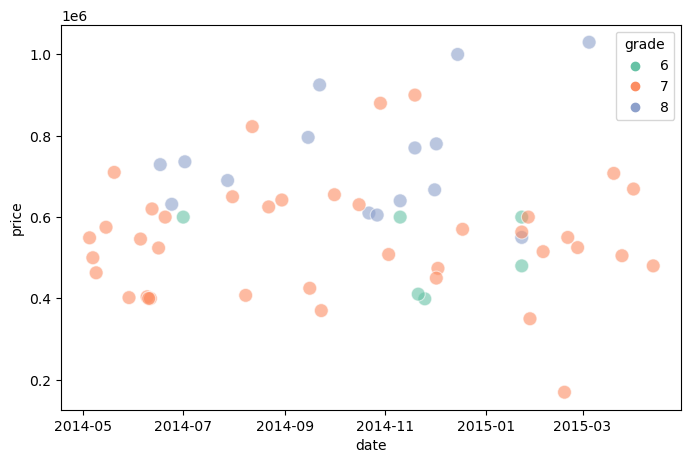

In [291]:
sns.scatterplot(data=df_central, x="date", y="price", hue="grade", palette="Set2", s=100, alpha=0.6)

In [292]:
df_central.query("grade == 8").describe()["price"]

count        15.000
mean     743966.667
std      144491.283
min      550000.000
25%      635750.000
50%      729000.000
75%      788000.000
max     1030000.000
Name: price, dtype: float64

in a central location  
usual grade 7 prices are between 456k and 627k  
usual grade 8 prices are between 635k and 788k  

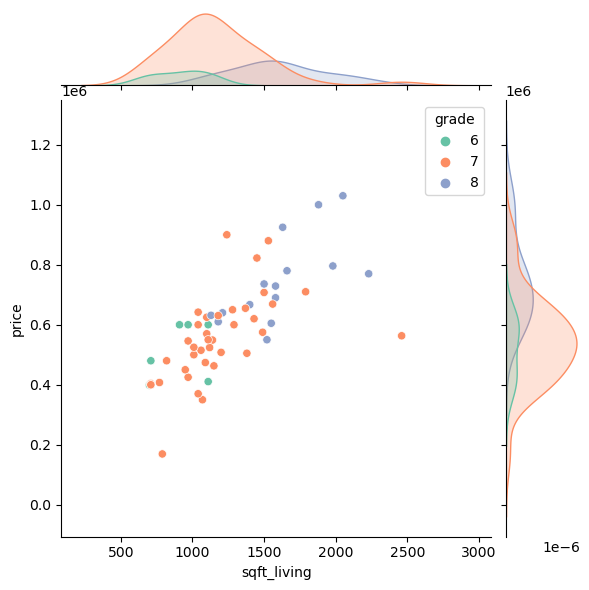

In [293]:
sns.jointplot(data=df_central, x="sqft_living", y="price", hue="grade", palette="Set2")

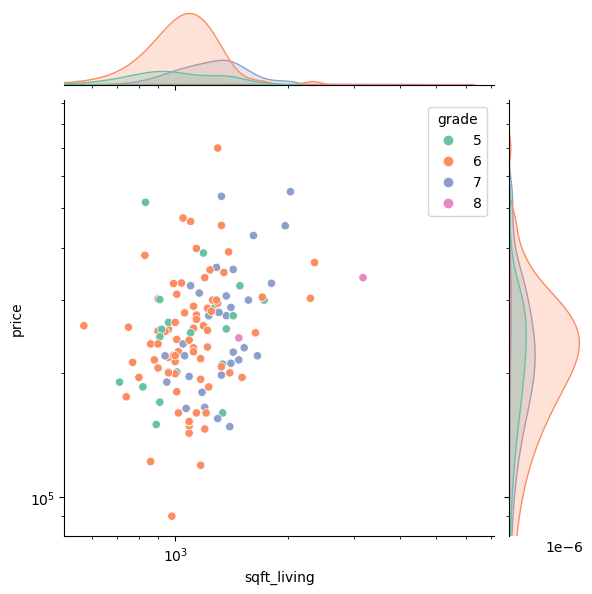

In [294]:
g = sns.jointplot(data=df_country, x="sqft_living", y="price", hue="grade", palette="Set2")
g.ax_joint.set_xscale('log')
g.ax_joint.set_yscale('log')

<AxesSubplot:xlabel='date', ylabel='price'>

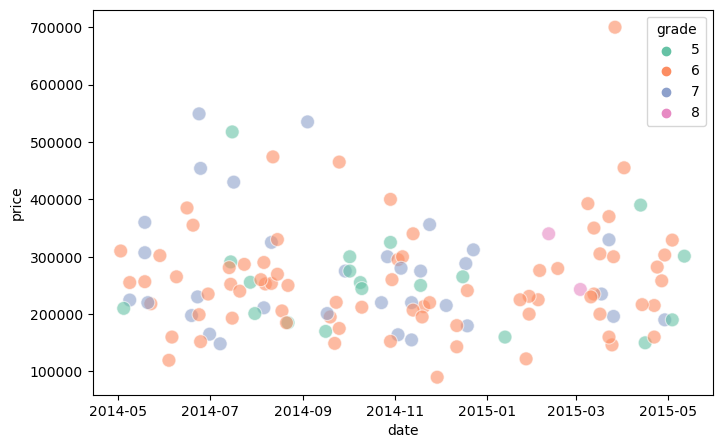

In [295]:
sns.scatterplot(data=df_country, x="date", y="price", hue="grade", palette="Set2", s=100, alpha=0.6)

In [296]:
df_country.query("grade == 8").describe()["price"]

count        2.000
mean    291500.000
std      68589.358
min     243000.000
25%     267250.000
50%     291500.000
75%     315750.000
max     340000.000
Name: price, dtype: float64

in a country location  
usual grade 7 prices are between 200k and 315k  
usual grade 8 prices are between 267k and 315k

when were the grade 8 houses sold and how many were they?

In [297]:
df_country8 = df_country.query("grade == 8")
df_country8

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,house_id
3331,7792000025,3.000,1.000,3180.000,27586.000,1.000,0.000,0.000,3,8,...,1969,0.000,98022,47.199,-121.967,2180.000,27586.000,2015-02-11,340000.000,3332
6819,1320069163,3.000,1.000,1480.000,15416.000,1.000,0.000,2.000,4,8,...,1955,0.000,98022,47.214,-121.987,1190.000,10758.000,2015-03-04,243000.000,6820


it was only two houses and they were sold in spring. Both were sold in 98022

recommendation: wait for a good offer in (Enumclaw) 98022. These are rare , but come along once in a while.  
but: it is far from seattle. 98019, 98070 are closer

lets look at 98019 and 98070

In [298]:
df_close = df_country.query("zipcode in [98019, 98070]")
df_close.columns

Index(['id', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'date', 'price', 'house_id'],
      dtype='object')

what factors are of most interest?  
* price
* area
* room number
* grade
* condition

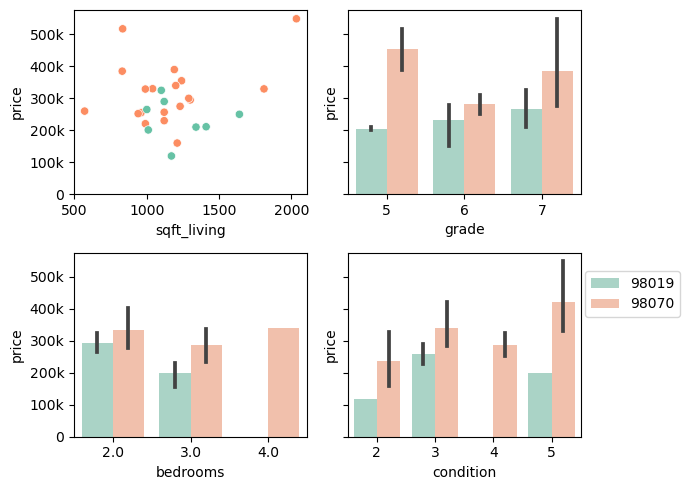

In [299]:
fig, axs = plt.subplots(2,2, figsize=(7,5), sharey=True)
legs = [False, False, False, 'auto']

sns.scatterplot(data=df_close, x='sqft_living', y="price", hue="zipcode", palette="Set2", ax=axs.flat[0], legend=False)

for i, feature in enumerate(['grade', 'bedrooms', 'condition']):
    sns.barplot(data=df_close, x=feature, y="price", hue="zipcode", ax=axs.flat[i+1], palette="Set2", alpha=0.6)
    if i==2:
        axs.flat[i+1].legend(loc=(1.02,0.65))
    else:
        axs.flat[i+1].legend_.remove()

for ax in axs.flat:
    # Apply the custom formatter to the y-axis
    ax = plt.gca()
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(format_large_number))

fig.tight_layout()

In [300]:
df_close.query("zipcode == 98070")['price'].describe()

count       19.000
mean    317317.579
std      95880.921
min     160000.000
25%     255750.000
50%     300000.000
75%     347500.000
max     549000.000
Name: price, dtype: float64

Duvall (98019) has a better price/value ratio  
price range: 120k - 325k
there are nice lakes and parks nearby  
  
Vashon is more expensive,
but it is a nice island  
price range: 160k - 550k

In [301]:
df_co = df_country.query("zipcode in [98019, 98022, 98070]")

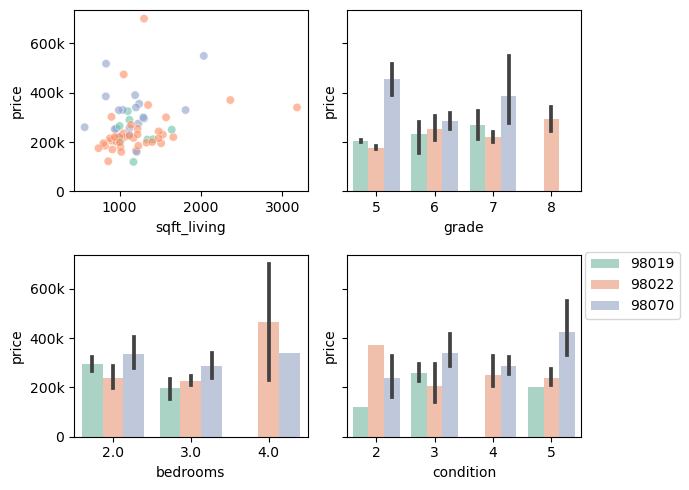

In [302]:
fig, axs = plt.subplots(2,2, figsize=(7,5), sharey=True)
legs = [False, False, False, 'auto']

sns.scatterplot(data=df_co, x='sqft_living', y="price", hue="zipcode", palette="Set2", ax=axs.flat[0], legend=False, alpha=0.6)

for i, feature in enumerate(['grade', 'bedrooms', 'condition']):
    sns.barplot(data=df_co, x=feature, y="price", hue="zipcode", ax=axs.flat[i+1], palette="Set2", alpha=0.6)
    if i==2:
        axs.flat[i+1].legend(loc=(1.02,0.65))
    else:
        axs.flat[i+1].legend_.remove()

for ax in axs.flat:
    # Apply the custom formatter to the y-axis
    ax = plt.gca()
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(format_large_number))

fig.tight_layout()

In [303]:
df_co.columns

Index(['id', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'date', 'price', 'house_id'],
      dtype='object')

In [304]:
df_co.query("zipcode == 98019")[["zipcode","price","condition","grade","bedrooms", "yr_built"]]

,zipcode,price,condition,grade,bedrooms,yr_built
1772,98019,210000.000,3,5,3.000,1953
3735,98019,211000.000,3,7,3.000,1981
4328,98019,290000.000,3,6,2.000,1976
4423,98019,325000.000,3,7,2.000,1980
5522,98019,119500.000,2,6,3.000,1980
13038,98019,201000.000,5,5,3.000,1961
14927,98019,265000.000,3,6,2.000,1960
19237,98019,250000.000,3,6,3.000,1975


Enumclaw has best price/value ration, but is far off and most rural  
Duvall has a good price/value ratio, and is close to city location houses are relatively old and in moderate condition
Vashon is not too far off and is a nice island, but a bit pricier

again, what about timing?

<AxesSubplot:xlabel='date', ylabel='price'>

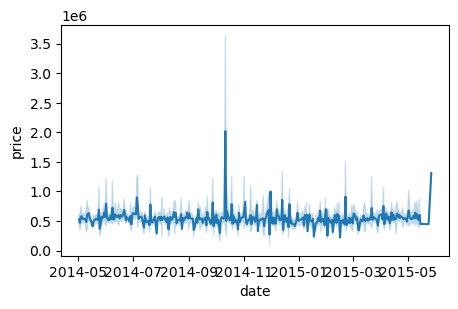

In [315]:
fig = plt.figure(figsize=(5,3))
sns.lineplot(data=df_full, x="date", y="price")

In [310]:
df_full.groupby("date").count().index

DatetimeIndex(['2014-05-02', '2014-05-03', '2014-05-04', '2014-05-05',
               '2014-05-06', '2014-05-07', '2014-05-08', '2014-05-09',
               '2014-05-10', '2014-05-11',
               ...
               '2015-05-08', '2015-05-09', '2015-05-10', '2015-05-11',
               '2015-05-12', '2015-05-13', '2015-05-14', '2015-05-15',
               '2015-05-24', '2015-05-27'],
              dtype='datetime64[ns]', name='date', length=372, freq=None)

In [366]:
for df in [df_full, df_central, df_co]:
    df['year'] = df["date"].apply(lambda x: x.year)
    df['month'] = df["date"].apply(lambda x: x.month)

In [422]:
monthly_prices = [df.groupby(["year", "month"]).median()["price"].reset_index() for df in [df_full, df_central, df_co]]
#monthly_prices[1].loc[12] = {"year": 2015, "month": 5, "price": 0}
for df in monthly_prices:
    df["year-month"] = df.apply(lambda x: f"{int(x['year'])}-{int(x['month'])}", axis=1)

In [426]:
from scipy.interpolate import interp1d

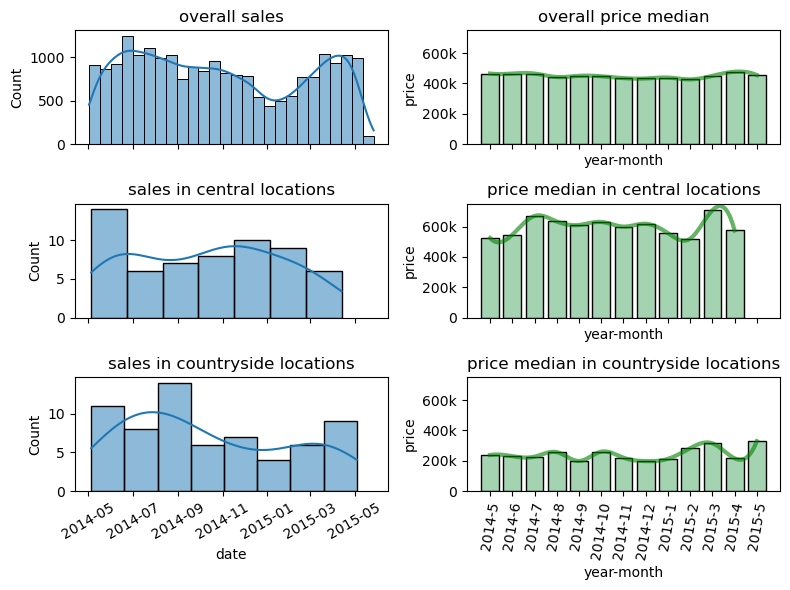

In [438]:
fig, axs = plt.subplots(3,2, figsize=(8,6), sharex='col')
titles_sales = ["overall sales", "sales in central locations", "sales in countryside locations"]
titles_prices = ["overall price median", "price median in central locations", "price median in countryside locations"]

for i, df in enumerate([df_full, df_central, df_co]):
    sns.histplot(data=df, x="date", kde=True, ax=axs[i,0])
    axs[i,0].tick_params(axis="x", rotation=30)
    axs[i,0].set_title(titles_sales[i])

for i, df in enumerate([df_full, df_central, df_co]):
    sns.barplot(data=monthly_prices[i], x="year-month", y="price", ax=axs[i,1], color="lightblue")
    axs[i,1].tick_params(axis="x", rotation=80)
    axs[i,1].set_title(titles_prices[i])
    axs[i,1].set_ylim(0, 750000)
    axs[i,1].yaxis.set_major_formatter(ticker.FuncFormatter(format_large_number))

    x = list(range(len(monthly_prices[i])))
    x_interp = np.linspace(x[0], x[-1], 100)

    y_values = monthly_prices[i].price
    y_interp = interp1d(x, y_values, kind="cubic")(x_interp)
    sns.lineplot(x_interp, y_interp, ax=axs[i,1], color="g", lw=3, alpha=0.6)
    #sns.scatterplot(x, y_values, ax=axs[i,1], color="g")

    for bar in axs[i,1].patches:
        bar.set_facecolor("#A4D3B2")
        bar.set_edgecolor("k")
        bar.set_linewidth(1)

fig.tight_layout()

overall sales are hihest in summer and spring

<AxesSubplot:>

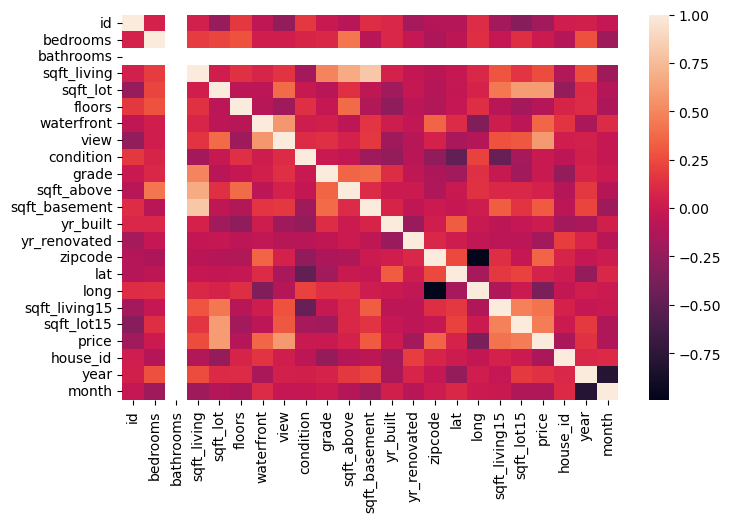

In [441]:
sns.heatmap(df_co.corr())